<a href="https://colab.research.google.com/github/austinbennysmith/CMIP6/blob/main/NAO_Final.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

Current weighting method:
* Multiply each data point by the square root of the cosine of its latitude before doing the SVD
* Dividing by the weights when plotting U but NOT when getting the Principal Components from VT. Does this make sense? I don't think it would make sense to divide by the weights for VT since it depends only on time. [This code](http://indico.ictp.it/event/a09161/session/11/contribution/7/material/0/0.pdf) uses the same method I use for weighting before the SVD computation and then dividing for plotting the left singular vectors, but they don't show time series so I'm not sure based on this site.

How do Scree Plots work with the weighting?

Do I need to fix the weighting for the graphs at the bottom with the running means?

In [ ]:
!pip install fsspec
!pip install netCDF4
!apt-get -qq install python-cartopy python3-cartopy;
!pip uninstall -y shapely;
!pip install shapely --no-binary shapely;
!pip install eofs
! pip install --upgrade xarray zarr gcsfs cftime nc-time-axis
import cartopy.crs as ccrs
import cartopy.feature as cfeature
from cartopy.mpl.ticker import LongitudeFormatter, LatitudeFormatter

from matplotlib import pyplot as plt
import numpy as np
from numpy import linalg as LA
import pandas as pd
import xarray as xr
import zarr
import fsspec
import gcsfs
from eofs.xarray import Eof
from nc_time_axis import NetCDFTimeConverter, CalendarDateTime
import cftime

%matplotlib inline
%config InlineBackend.figure_format = 'retina'
plt.rcParams['figure.figsize'] = 12, 6

from sklearn.preprocessing import StandardScaler

In [2]:
df = pd.read_csv('https://storage.googleapis.com/cmip6/cmip6-zarr-consolidated-stores.csv') 
df.head()

/usr/local/lib/python3.6/dist-packages/IPython/core/interactiveshell.py:2718: DtypeWarning: Columns (10) have mixed types.Specify dtype option on import or set low_memory=False.
  interactivity=interactivity, compiler=compiler, result=result)


,activity_id,institution_id,source_id,experiment_id,member_id,table_id,variable_id,grid_label,zstore,dcpp_init_year,version
0,AerChemMIP,AS-RCEC,TaiESM1,histSST,r1i1p1f1,AERmon,od550aer,gn,gs://cmip6/AerChemMIP/AS-RCEC/TaiESM1/histSST/...,NaN,20200310
1,AerChemMIP,BCC,BCC-ESM1,histSST,r1i1p1f1,AERmon,mmrbc,gn,gs://cmip6/AerChemMIP/BCC/BCC-ESM1/histSST/r1i...,NaN,20190718
2,AerChemMIP,BCC,BCC-ESM1,histSST,r1i1p1f1,AERmon,mmrdust,gn,gs://cmip6/AerChemMIP/BCC/BCC-ESM1/histSST/r1i...,NaN,20191127
3,AerChemMIP,BCC,BCC-ESM1,histSST,r1i1p1f1,AERmon,mmroa,gn,gs://cmip6/AerChemMIP/BCC/BCC-ESM1/histSST/r1i...,NaN,20190809
4,AerChemMIP,BCC,BCC-ESM1,histSST,r1i1p1f1,AERmon,mmrso4,gn,gs://cmip6/AerChemMIP/BCC/BCC-ESM1/histSST/r1i...,NaN,20191127


In [4]:
from datetime import date, timedelta
import netCDF4 as nc
psl_ssp585 = df.query("variable_id == 'psl' & experiment_id == 'ssp585' & institution_id == 'NCAR' & source_id == 'CESM2'")
for i in range(len(psl_ssp585)):
  print(i)

0
1
2


In [ ]:
# Accessing the file, getting it to just the lats and lons I want:
zstore = psl_ssp585.zstore.values[0]
mapper = fsspec.get_mapper(zstore)
ds = xr.open_zarr(mapper, consolidated=True, decode_times=True) # Make decode_times=True to convert dates to datetime objects?? The problem is, Colab doesn't seem to like my installation of nc-time-axis. I could try a Jupyter Binder, or keep Googling to try to solve this.
psl = ds.psl.sel(lat=slice(20,80))
psl = psl.where((ds.lon >= 270) | (ds.lon <= 40), drop=True)
lat = ds.lat.sel(lat=slice(20,80))
lon = ds.lon.where((ds.lon >= 270) | (ds.lon <= 40), drop=True) # Not sure exactly what drop means, but I think it doesn't matter


# Useful stackexchange post: https://stackoverflow.com/questions/40272222/select-xarray-pandas-index-based-on-specific-months
def is_djf(month):
  return (month>=12) | ((month>=1) & (month<=2))
def is_mam(month):
  return (month>=3) & (month<=5)
def is_jja(month):
  return (month>=6) & (month<=8)
def is_son(month):
  return (month>=9) & (month<=11)
psl_djf = psl.sel(time=is_djf(psl['time.month']))
psl_mam = psl.sel(time=is_mam(psl['time.month']))
psl_jja = psl.sel(time=is_jja(psl['time.month']))
psl_son = psl.sel(time=is_son(psl['time.month']))


psl_allseasons = {
    'DJF': psl_djf,
    'MAM': psl_mam,
    'JJA': psl_jja,
    'SON': psl_son
}
# Splitting it up by decade:
decades = np.arange(2010, 2110, 10)
decade_list = [] # I'll use decade_list for graphing.
for i in range(len(decades)):
  if i<(len(decades)-1):
    decade_list.append(str(decades[i])+'-'+str(decades[i+1]))
decade_list[0] = '2015-2020'

def in_decade(minyear, maxyear, year):
  return (year>=minyear) & (year<maxyear)
psl_FINAL = {
    'DJF': [],
    'MAM': [],
    'JJA': [],
    'SON': []
}
for j in psl_allseasons.keys():
  for i in range(1, len(decades)):
    psl_FINAL[j].append(psl_allseasons[j].sel(time=in_decade(decades[i-1], decades[i], psl_allseasons[j]['time.year'])))

# I need to weight the data by the square root of the cosine of latitude. Right now I think it's working
psl_WEIGHTED = {
    'DJF': [],
    'MAM': [],
    'JJA': [],
    'SON': []
}
weights = np.sqrt(np.cos(np.radians(psl_FINAL['JJA'][0].lat))) # Latitudes are the same for all of the sub-datasets, so I can define the weights according to latitude based on a randomly chosen sub-dataset outside of the for loop to save time
for season in psl_FINAL.keys():
  for i in range(len(psl_FINAL[season])): # Need to do this for each decade within the seasonal dictionary entries
    tlength = len(psl_FINAL[season][i].time) # Need to have the correct time length in order to make the arrays below.
    psl_weighted = np.ones((tlength, 64, 105)) # This will be filled up with the weighted latitudes.
    loaded_psl = psl_FINAL[season][i].values #Loading the data before the for loop drastically speeds up the program
    for j in range(64):
      psl_weighted[:, j, :] = loaded_psl[:, j, :]*float(weights[j])
    psl_WEIGHTED[season].append(psl_weighted)

Udict = {
    'DJF': [],
    'MAM': [],
    'JJA': [],
    'SON': []
}
sdict = {
    'DJF': [],
    'MAM': [],
    'JJA': [],
    'SON': []
}
VTdict = {
    'DJF': [],
    'MAM': [],
    'JJA': [],
    'SON': []
}
Sigmadict = {
    'DJF': [],
    'MAM': [],
    'JJA': [],
    'SON': []
}
estimatedict = {
    'DJF': [],
    'MAM': [],
    'JJA': [],
    'SON': []
}

for key in psl_FINAL.keys():
  for i in range(9):
    print(i)
    tlength = len(psl_FINAL[key][i].time) # The psl_WEIGHTED dictionary does not contain DataArray objects, so I can't just get the time from that.
    psl2d = np.reshape(psl_WEIGHTED[key][i], (tlength, 6720)) # This is the only line in the for loop I changed when adding in the weighting
    psl2d = np.matrix.transpose(psl2d)
    Unow, snow, VTnow = LA.svd(psl2d, full_matrices=False)
    Sigmanow = np.diag(snow)
    estimatenow = Unow[:, :1] @ Sigmanow[0:1, :1] @ VTnow[:1, :]
    estimatenow = np.matrix.transpose(estimatenow) #Doing this so that I can later reshape the approximation matrix to have dimensionality (time, lat, lon), for consistency since this is how the climate NetCDF files are typically structured.
    Udict[key].append(Unow)
    sdict[key].append(snow)
    VTdict[key].append(VTnow)
    estimatedict[key].append(estimatenow)

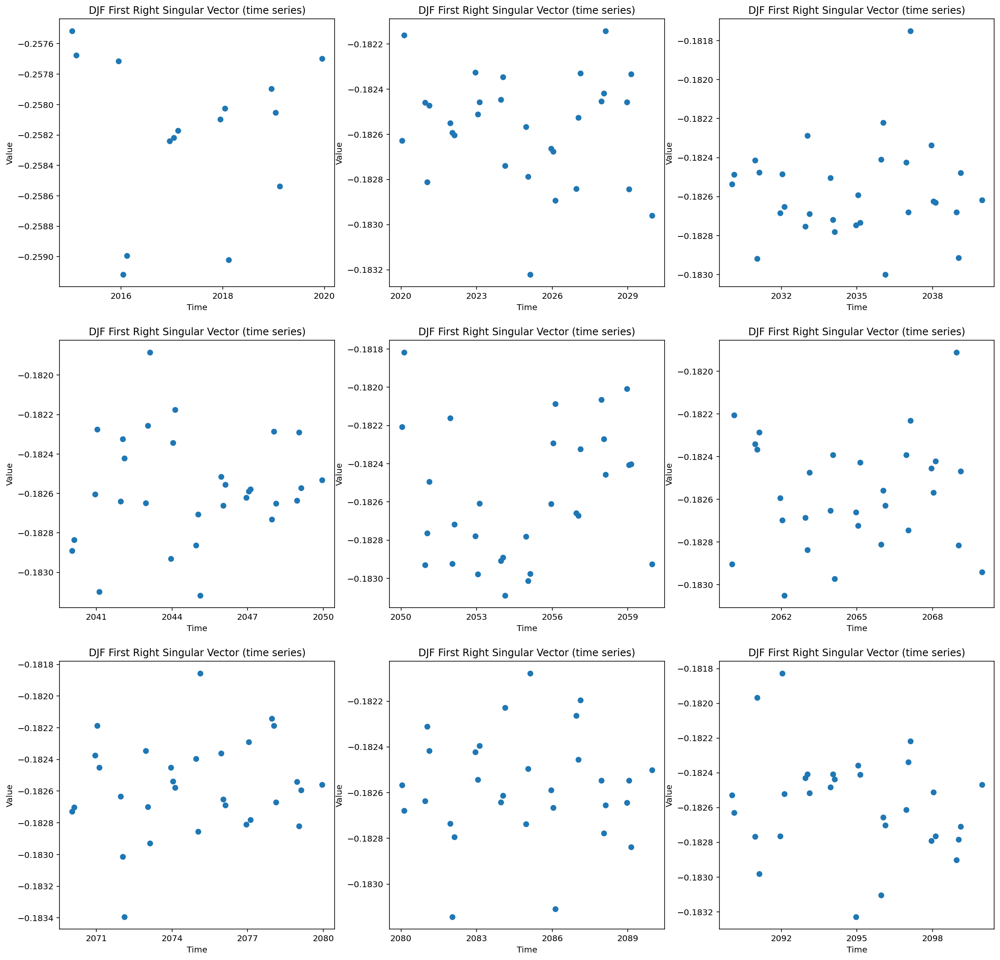

/usr/lib/python3/dist-packages/cartopy/io/__init__.py:264: DownloadWarning: Downloading: http://naciscdn.org/naturalearth/110m/physical/ne_110m_coastline.zip
  warnings.warn('Downloading: {}'.format(url), DownloadWarning)


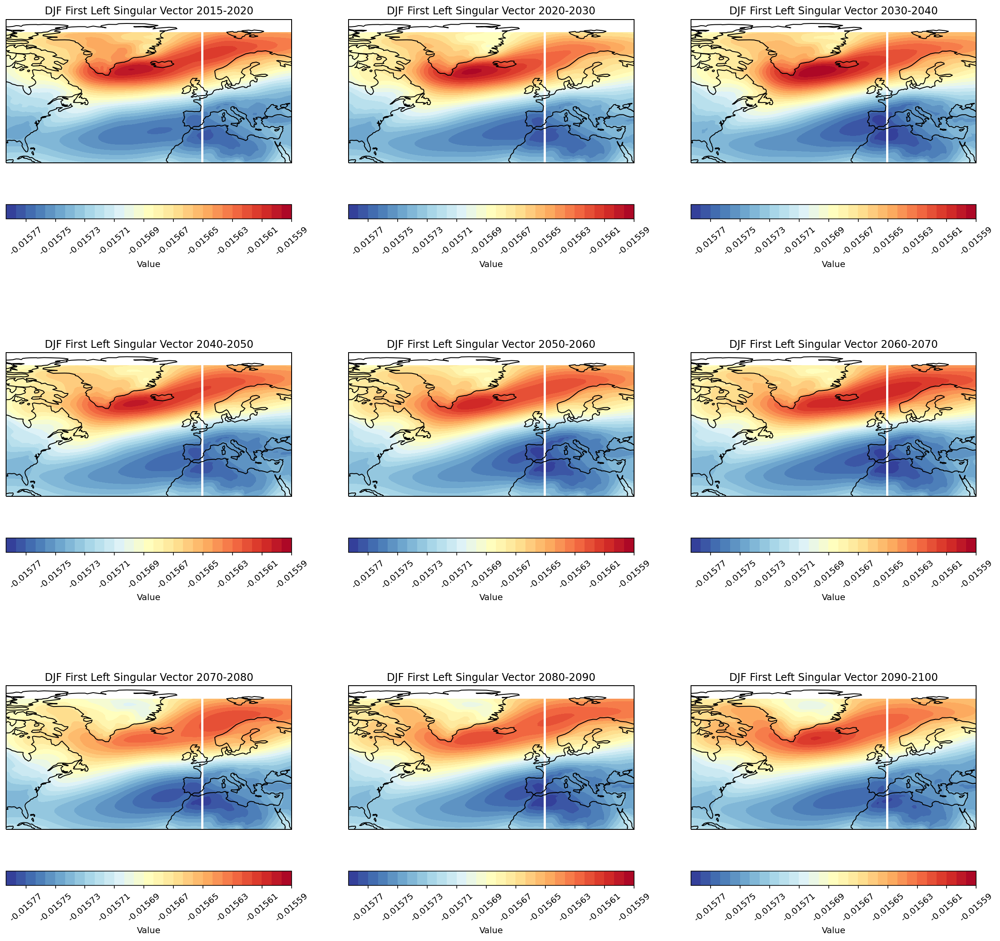

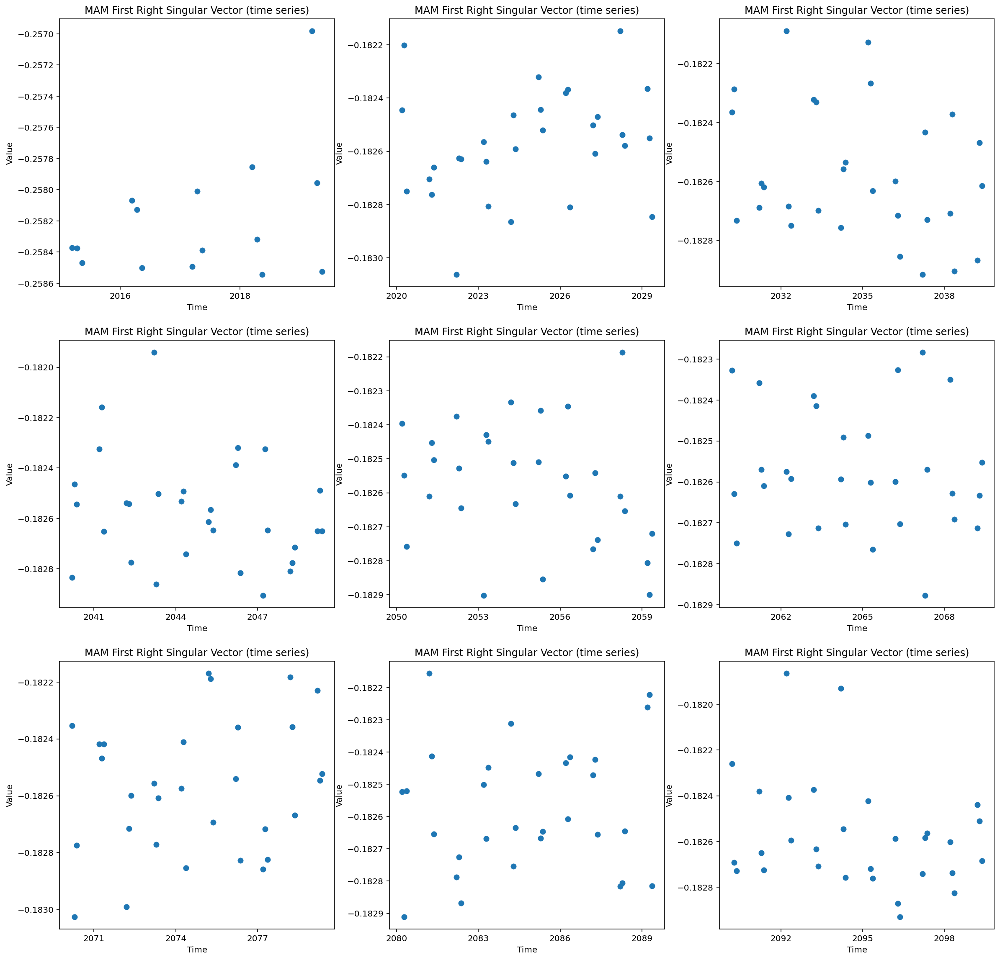

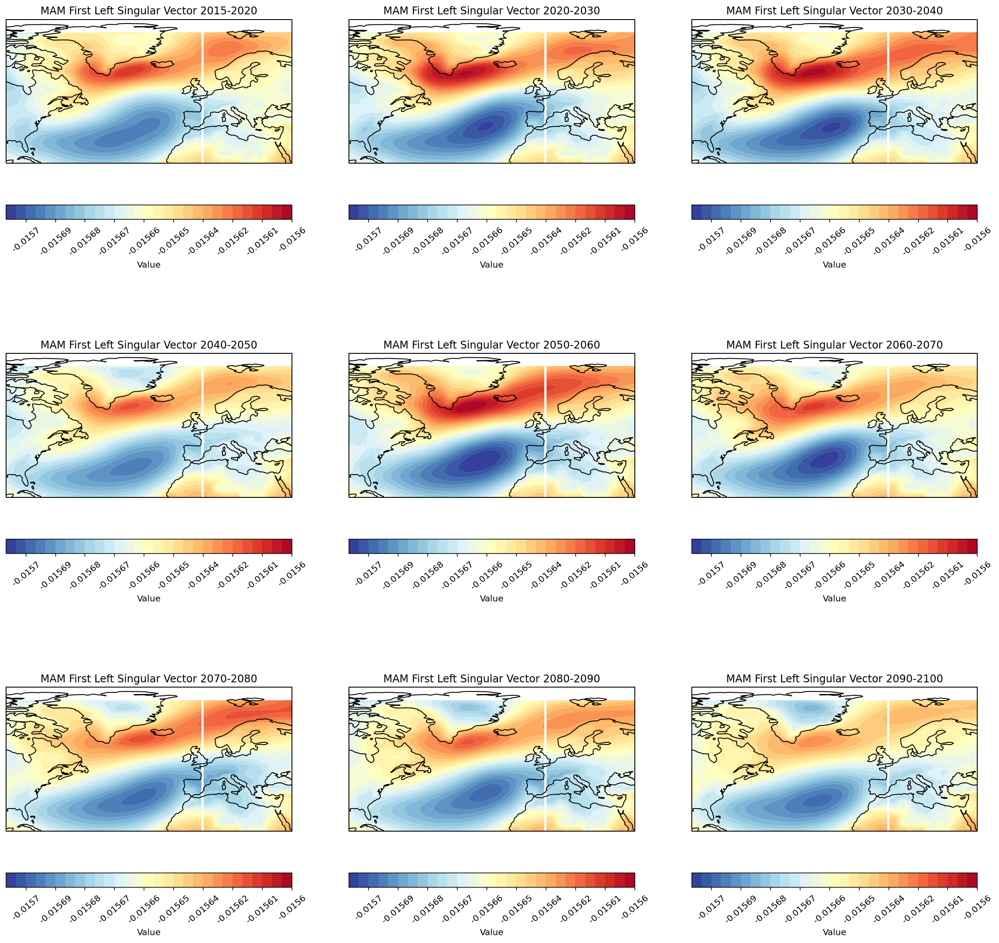

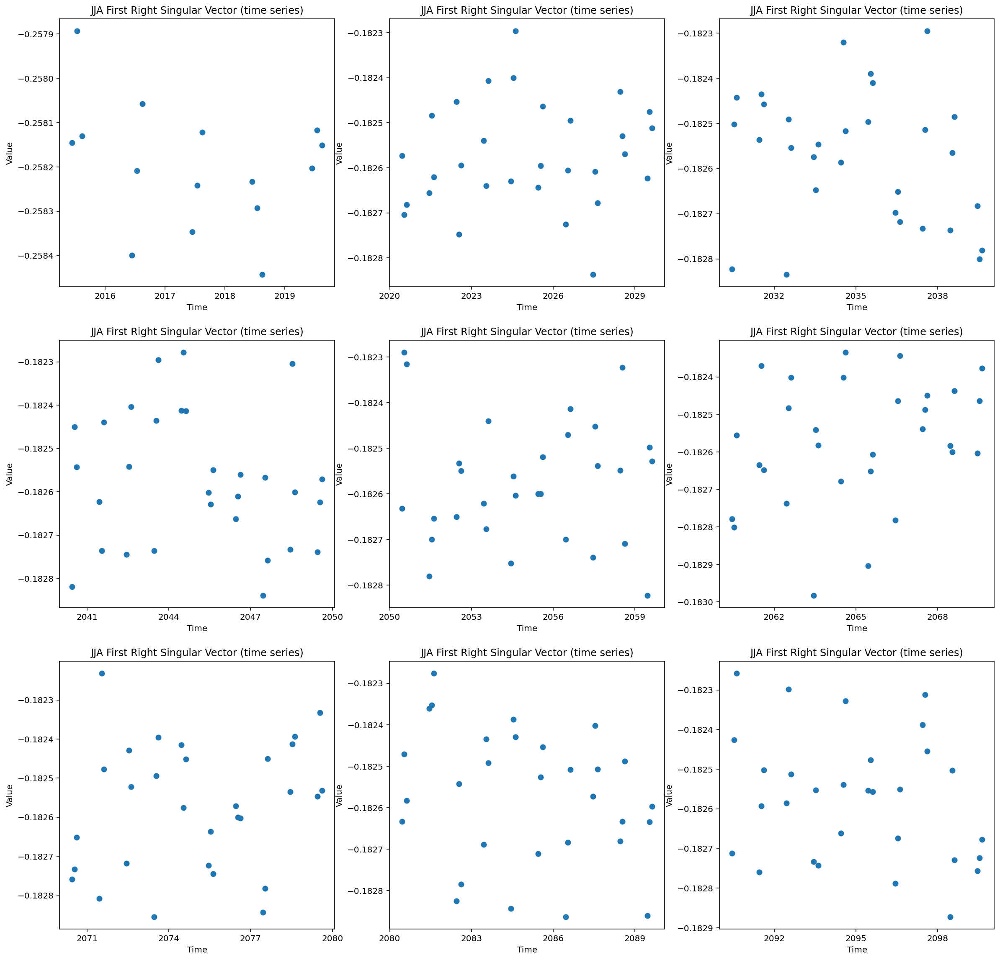

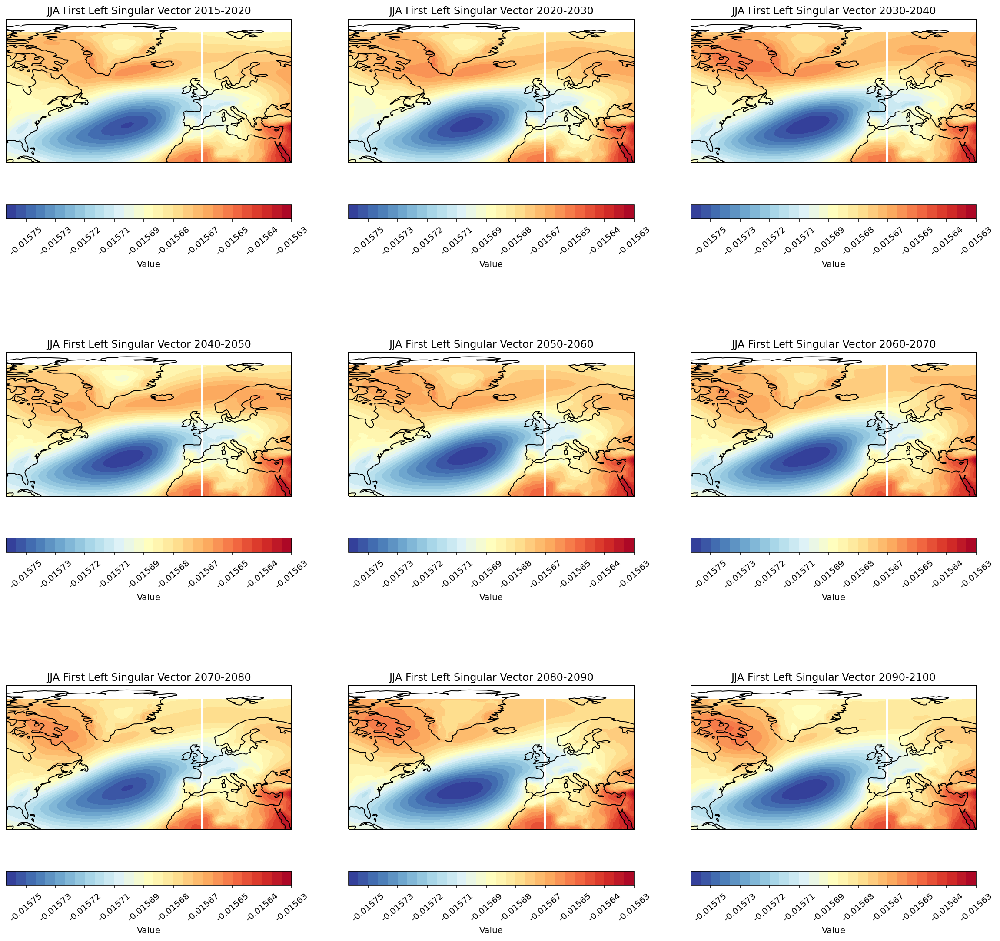

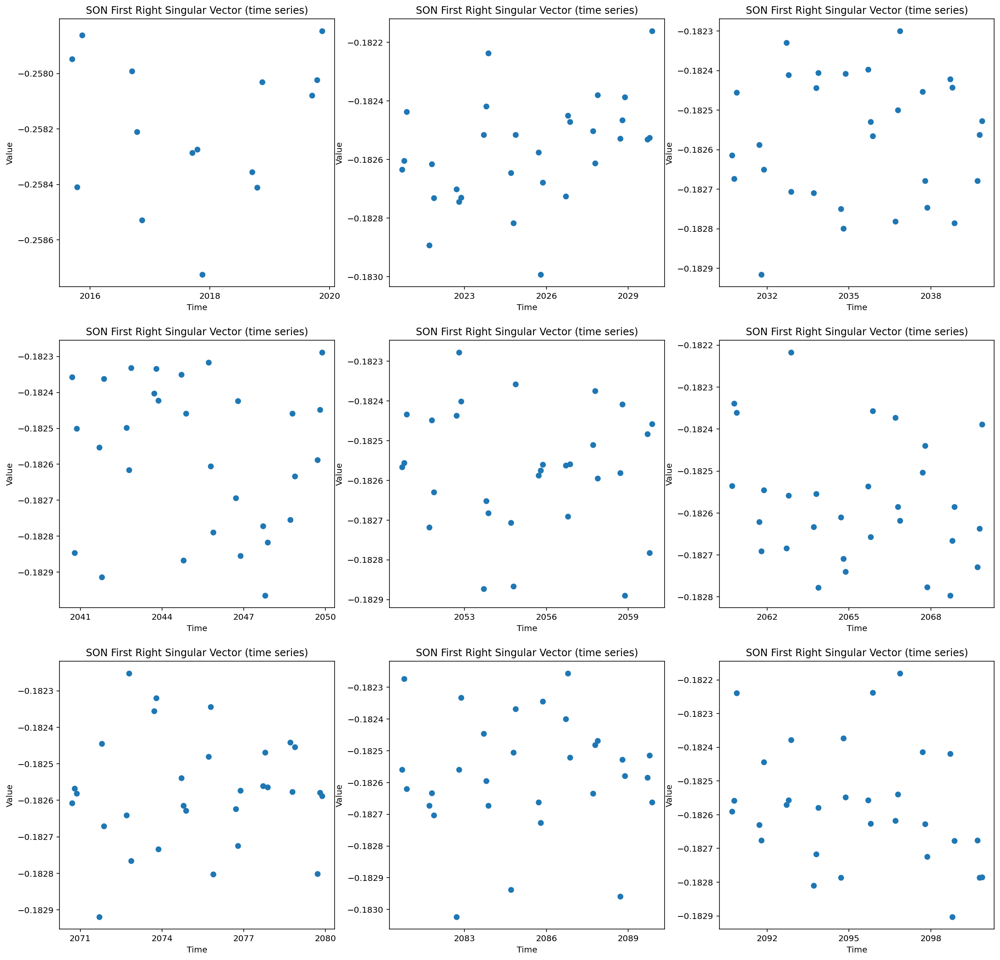

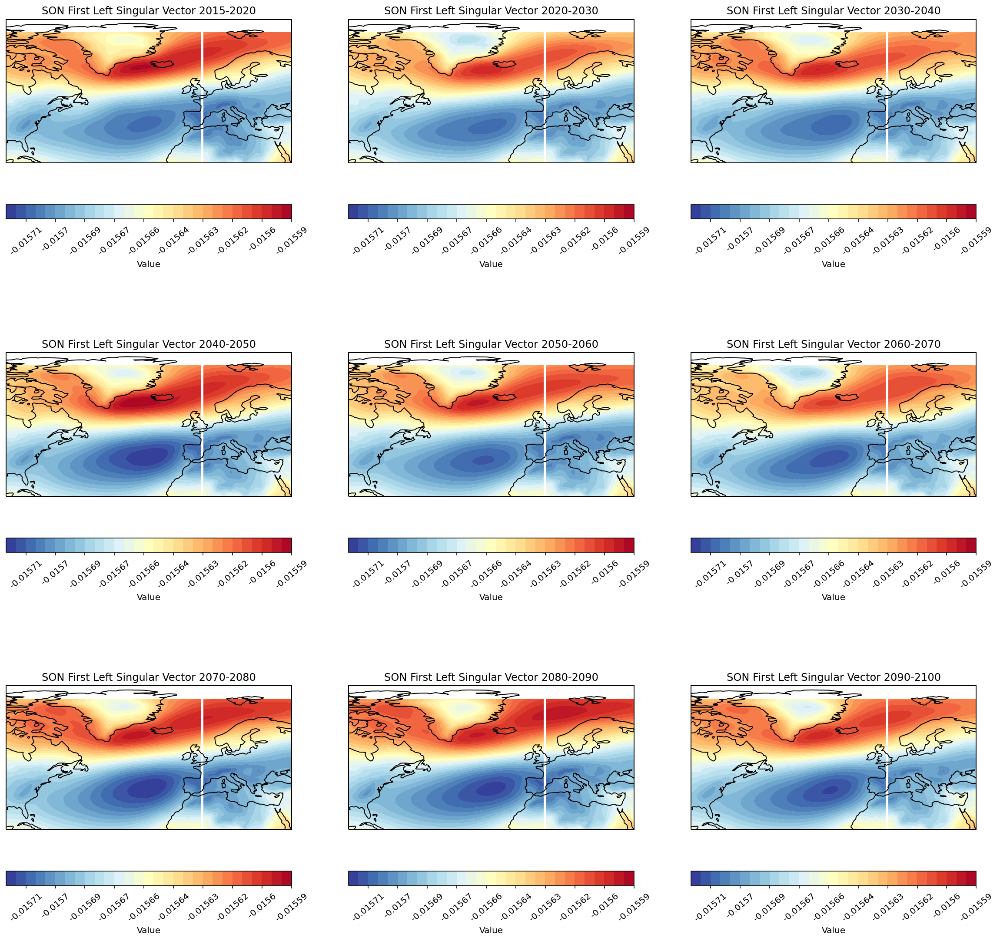

In [ ]:
def svectors(season):
  mins = []
  maxes = []
  for i in range(len(Udict[season])):
    U1 = Udict[season][i][:, 0]
    U12d = U1.reshape((64, 105))
    U12d=np.matmul(np.diag(weights**-1), U12d)
    for j in U12d:
      mins.append(min(j))
      maxes.append(max(j))
  # print(min(mins), max(maxes))
  minimum = min(mins)
  maximum=max(maxes)
  
  cmap1=plt.cm.RdYlBu_r
  levels = np.linspace(minimum, maximum, 30)
  # levels = np.linspace(-0.015700901684942033, -0.015352819022413573, 10)
  fig = plt.figure()
  fig.set_figheight(20)
  fig.set_figwidth(20)
  for i in range(9):
    ax1 = fig.add_subplot(3, 3, i+1)
    ax1.plot(psl_FINAL[season][i].time, VTdict[season][i][0], 'o') #The first index here tells where in the list of VT matrices to go from (i.e. which decade), the second index tells which eigen time series to graph
    ax1.set_title(season+' First Right Singular Vector (time series)')
    ax1.set_ylabel('Value')
    ax1.set_xlabel('Time')
  plt.show()
  fig2, axarr = plt.subplots(nrows=3, ncols=3, figsize=(20, 20), subplot_kw={'projection': ccrs.PlateCarree()})
  axlist = axarr.flatten() # Helpful code: https://unidata.github.io/MetPy/latest/examples/Four_Panel_Map.html
  for i in range(9):
    U1 = Udict[season][i][:, 0] # Each column of U is a "basis eigenpattern" that represents a direction of variability in the dataset. I'm just looking at the first basis eigenpattern, which is by FAR the most important one (can be demonstrated by plotting the singular values)
    U12d = U1.reshape((64, 105)) # Getting it reshaped so that I can graph it as lat, lon
    U12d=np.matmul(np.diag(weights**-1), U12d)
    cs=axlist[i].contourf(lon, lat, U12d,levels,
                  transform=ccrs.PlateCarree(),
                  cmap=cmap1)
    axlist[i].coastlines()
    axlist[i].set_extent([-90, 40, 20, 80]) # longitude latitude extent
    cbar = fig.colorbar(cs, ax=axlist[i], orientation='horizontal') # color map
    cbar.ax.set_xticklabels([round(i, 5) for i in levels], rotation=40)
    cbar.set_label('Value')
    axlist[i].set_title(season+' First Left Singular Vector '+decade_list[i])
  plt.show()
for key in psl_FINAL.keys():
  svectors(key)

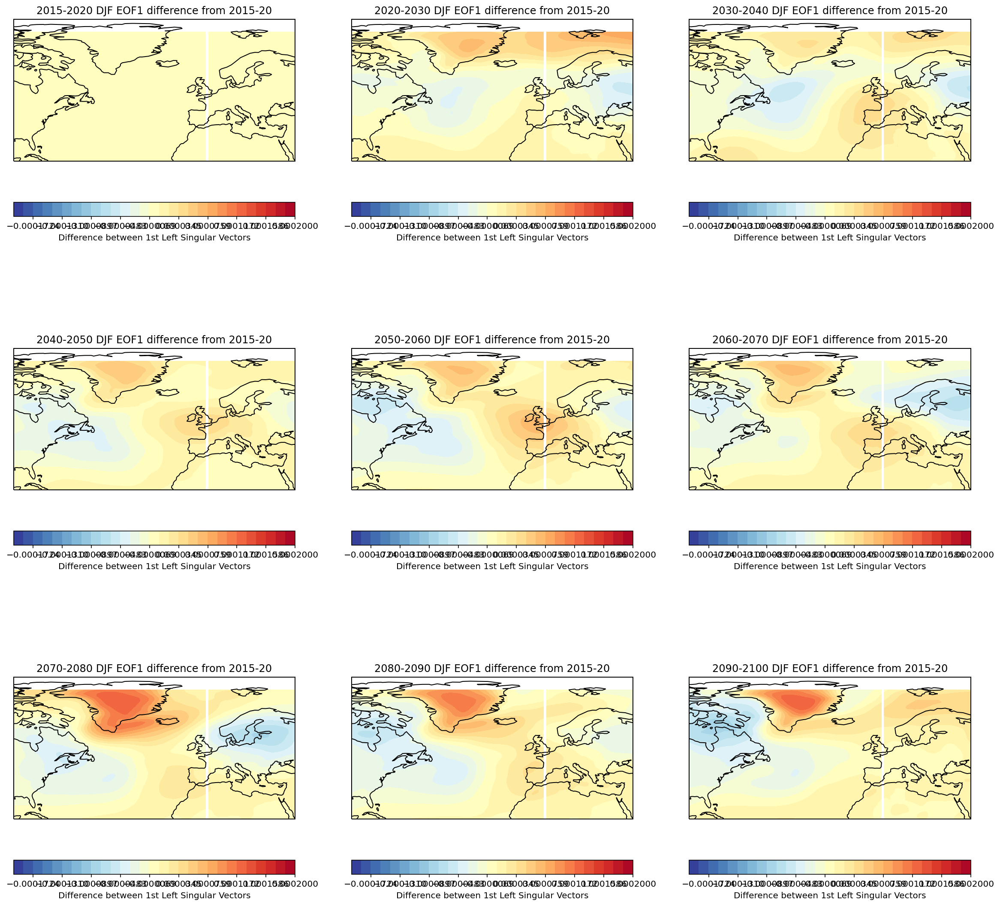

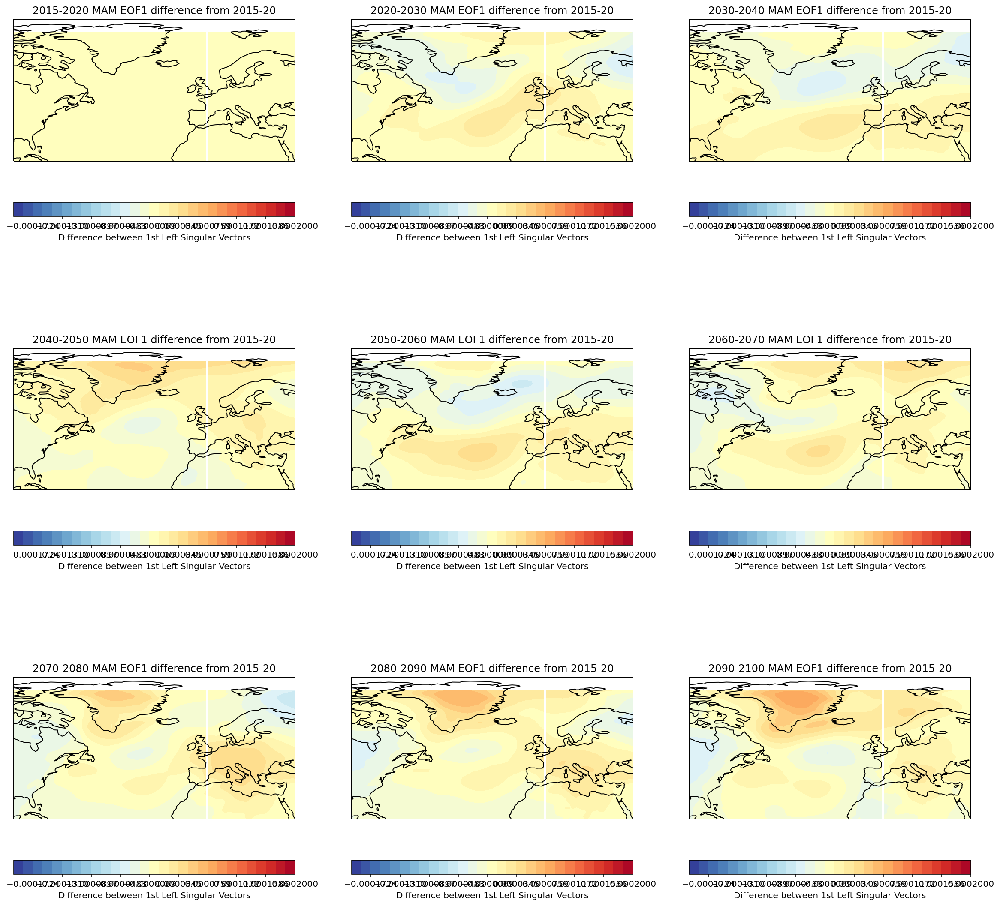

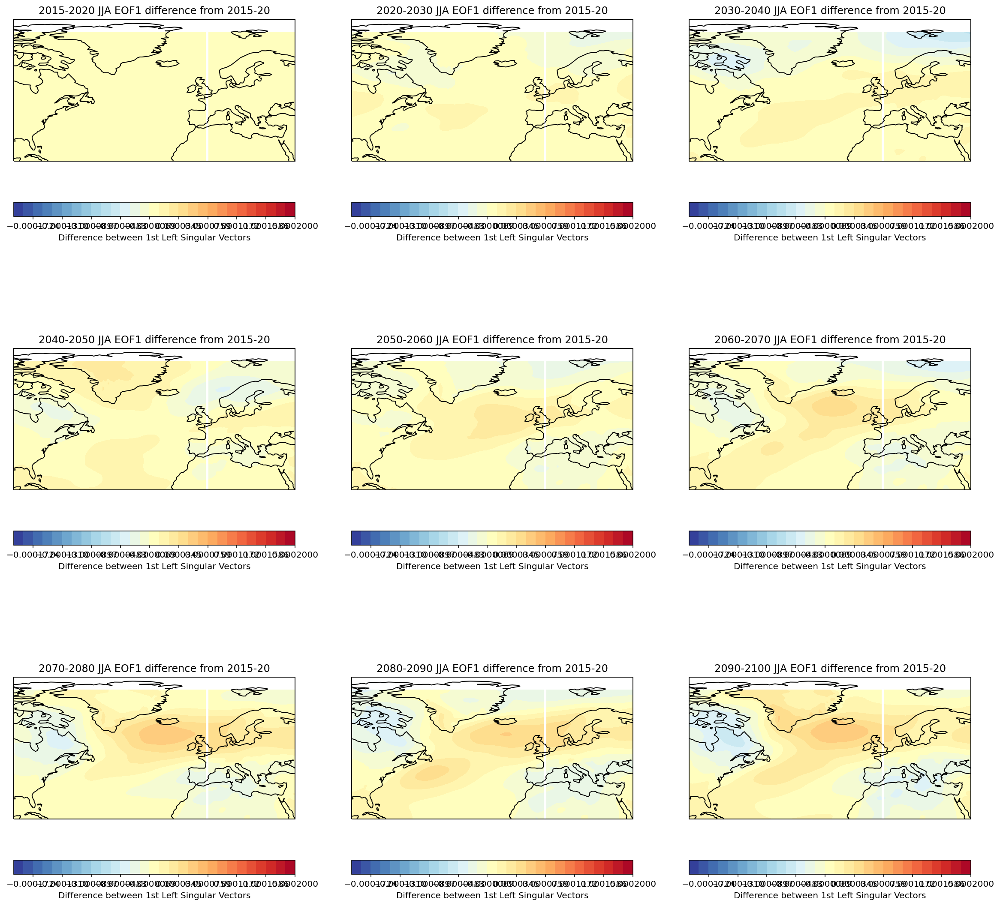

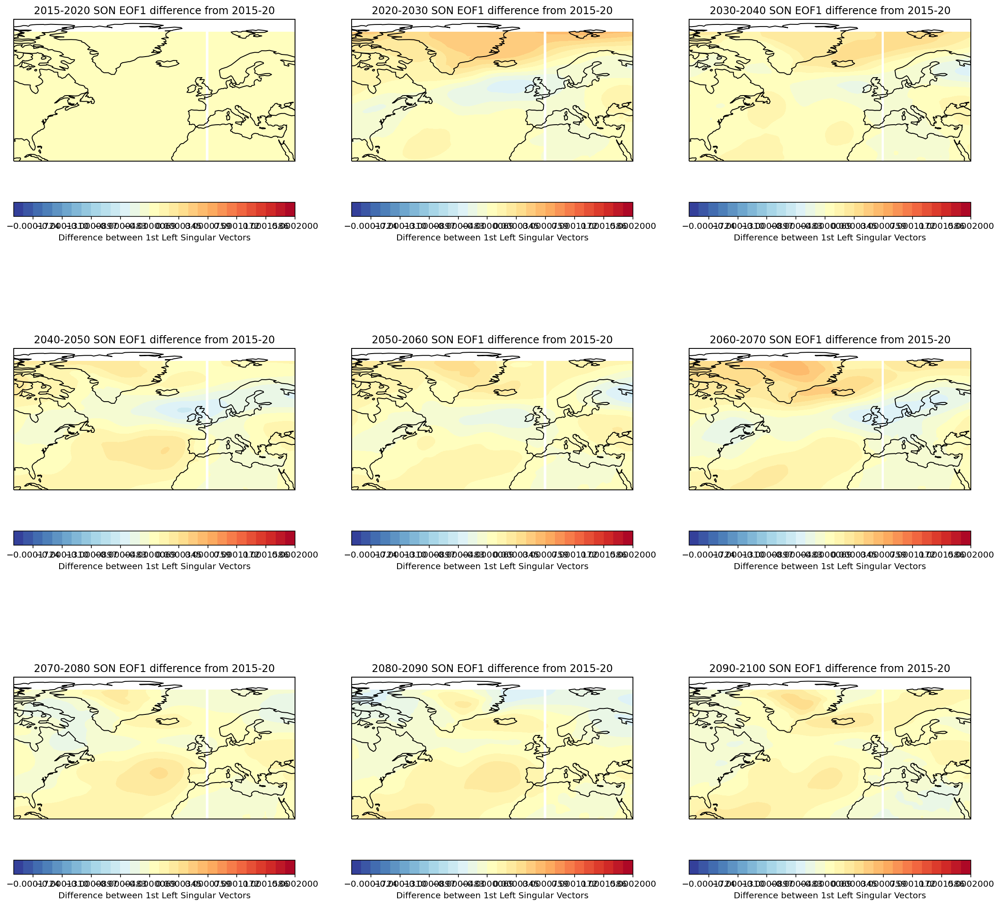

In [ ]:
def changes(season):
  Ustart = Udict[season][0][:,  0]
  Ustart2d = Ustart.reshape((64, 105))
  Ustart2d=np.matmul(np.diag(weights**-1), Ustart2d)
  # diffLevels = np.linspace(-4.7268346e-05, 4.6583824e-05, 10)
  diffLevels=np.linspace(-2e-4, 2e-4, 30)
  fig, axarr = plt.subplots(nrows=3, ncols=3, figsize=(20, 20), subplot_kw={'projection': ccrs.PlateCarree()})
  axlist = axarr.flatten()
  cmap1=plt.cm.RdYlBu_r
  for i in range(len(Udict[season])):
    U1 = Udict[season][i][:, 0] # Each column of U is a "basis eigenpattern" that represents a direction of variability in the dataset. I'm just looking at the first basis eigenpattern, which is by FAR the most important one (can be demonstrated by plotting the singular values)
    U12d = U1.reshape((64, 105)) # Getting it reshaped so that I can graph it as lat, lon
    U12d=np.matmul(np.diag(weights**-1), U12d)
    cs=axlist[i].contourf(lon, lat, Ustart2d-U12d,diffLevels,
                  transform=ccrs.PlateCarree(),
                  cmap=cmap1)
    axlist[i].coastlines()
    axlist[i].set_extent([-90, 40, 20, 80]) # longitude latitude extent
    cbar = fig.colorbar(cs, ax=axlist[i], orientation='horizontal') # color map
    cbar.set_label('Difference between 1st Left Singular Vectors')
    axlist[i].set_title(decade_list[i]+' '+season+' EOF1 difference from 2015-20')
  plt.show()
for key in psl_FINAL.keys():
  changes(key)

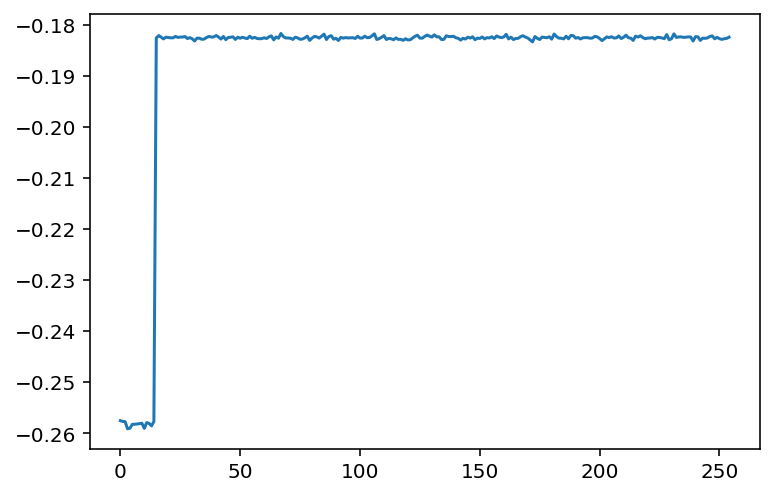

In [ ]:
full_timeSeries = np.array([])
for i in range(9):
  full_timeSeries = np.append(full_timeSeries, VTdict['DJF'][i][0])
plt.plot(full_timeSeries)

## NAO Index 21st century trend:
Based on this normalization formula: https://www.statisticshowto.com/probability-and-statistics/normal-distributions/normalized-data-normalization/

In [6]:
# weights = np.sqrt(np.cos(np.radians(psl_FINAL['JJA'][0].lat))) # Latitudes are the same for all of the sub-datasets, so I can define the weights according to latitude based on a randomly chosen sub-dataset outside of the for loop to save time
# for season in psl_FINAL.keys():
#   for i in range(len(psl_FINAL[season])): # Need to do this for each decade within the seasonal dictionary entries
#     tlength = len(psl_FINAL[season][i].time) # Need to have the correct time length in order to make the arrays below.
#     psl_weighted = np.ones((tlength, 64, 105)) # This will be filled up with the weighted latitudes.
#     loaded_psl = psl_FINAL[season][i].values #Loading the data before the for loop drastically speeds up the program
#     for j in range(64):
#       psl_weighted[:, j, :] = loaded_psl[:, j, :]*float(weights[j])
#     psl_WEIGHTED[season].append(psl_weighted)

century_trends = {
    'DJF': {},
    'JJA': {},
    'MAM': {},
    'SON': {}
}
for key in psl_FINAL.keys():
  print(key)
  tlength = len(psl_allseasons[key].time) # The psl_WEIGHTED dictionary does not contain DataArray objects, so I can't just get the time from that.
  psl2d = np.reshape(psl_allseasons[key].values, (tlength, 6720)) # This is the only line in the for loop I changed when adding in the weighting
  psl2d = np.matrix.transpose(psl2d)
  Unow, snow, VTnow = LA.svd(psl2d, full_matrices=False)
  century_trends[key]['U'] = Unow
  century_trends[key]['s'] = snow
  century_trends[key]['VT'] = VTnow

DJF
MAM
JJA
SON


In [45]:
eigenpatterns = {}
SEASONS = ['DJF', 'MAM', 'JJA', 'SON']
# Moving average code from https://stackoverflow.com/questions/14313510/how-to-calculate-rolling-moving-average-using-numpy-scipy
def moving_average(x, w):
    return np.convolve(x, np.ones(w), 'valid') / w
for singVal in range(2): # the range here decides for how many singular values the patterns are normalized and smoothed
  eigenpatterns['singVal '+str(singVal)]={
      'anomalies': {},
      'normalized': {},
      'smoothed': {}
  }
  for season in SEASONS:
    eigenpatterns['singVal '+str(singVal)]['anomalies'][season] = century_trends[season]['VT'][singVal]-np.mean(century_trends[season]['VT'][singVal])
    eigenpatterns['singVal '+str(singVal)]['normalized'][season] = eigenpatterns['singVal '+str(singVal)]['anomalies'][season]/np.std(century_trends[season]['VT'][singVal])
    nao_smoothed = moving_average(eigenpatterns['singVal '+str(singVal)]['anomalies'][season], 30) # Doing the moving average for 30 points because each season is 3 months per year - so this is a 10 year running mean
    eigenpatterns['singVal '+str(singVal)]['smoothed'][season] = nao_smoothed/np.std(nao_smoothed)

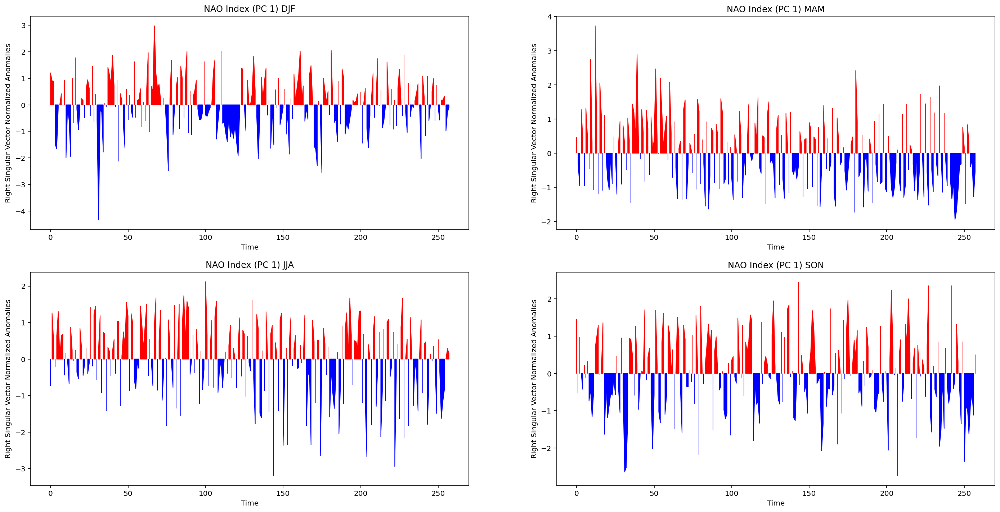

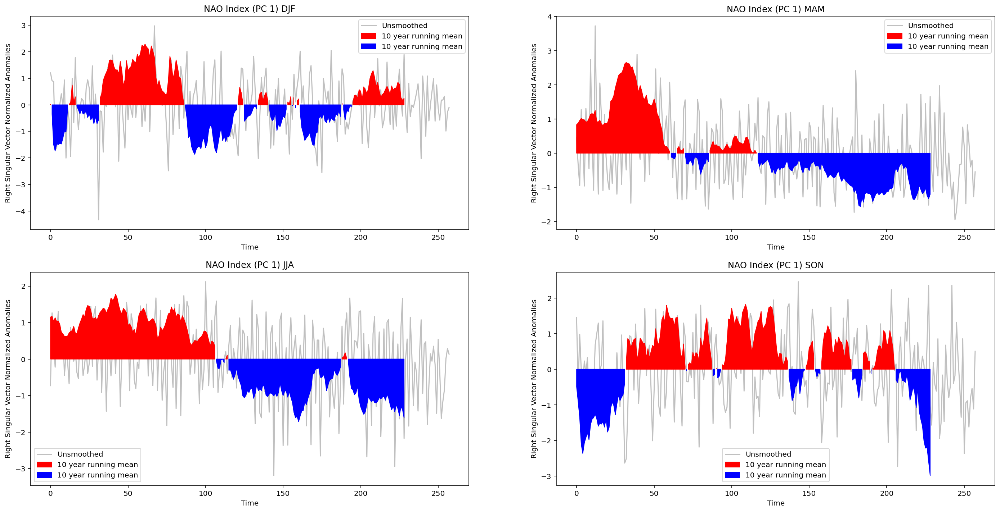

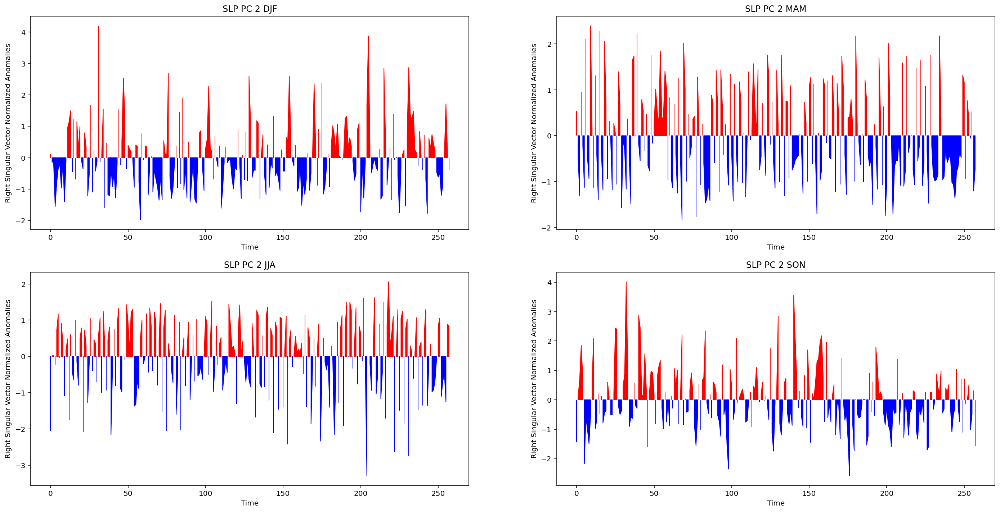

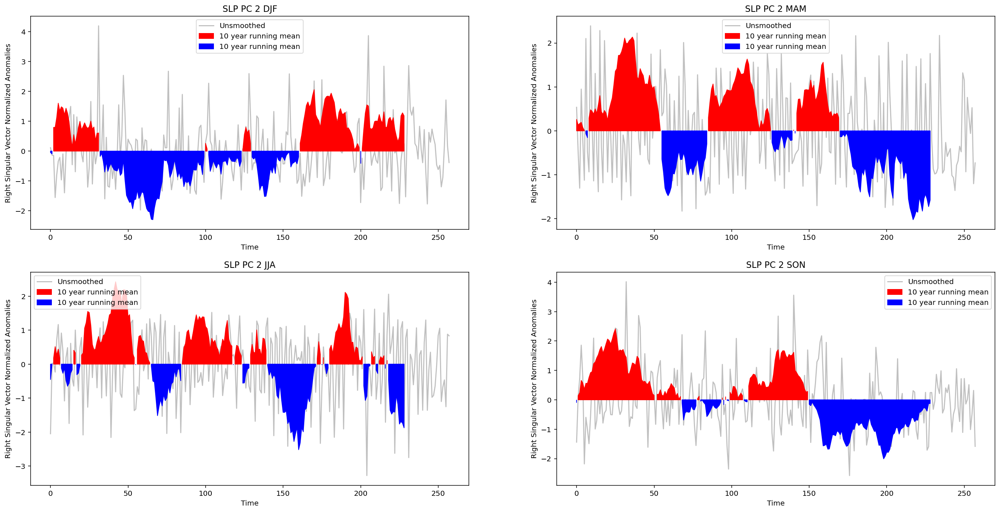

In [56]:
for singVal in eigenpatterns:
  fig, axs = plt.subplots(2, 2, figsize=[24, 12])
  axlist = axs.flatten()
  for season in SEASONS:
    x = np.arange(0, 258)
    axlist[SEASONS.index(season)].fill_between(x, 0, eigenpatterns['singVal '+singVal[-1]]['normalized'][season], where=eigenpatterns['singVal '+singVal[-1]]['normalized'][season]>0, color='r')
    axlist[SEASONS.index(season)].fill_between(x, 0, eigenpatterns['singVal '+singVal[-1]]['normalized'][season], where=eigenpatterns['singVal '+singVal[-1]]['normalized'][season]<0, color='b')
    if int(singVal[-1])==0:
      axlist[SEASONS.index(season)].set_title('NAO Index (PC 1) '+season)
    else:
      axlist[SEASONS.index(season)].set_title('SLP PC '+str(int(singVal[-1])+1)+' '+season)
    axlist[SEASONS.index(season)].set_ylabel('Right Singular Vector Normalized Anomalies')
    axlist[SEASONS.index(season)].set_xlabel('Time')
  plt.show()
  fig, axs = plt.subplots(2, 2, figsize=[24, 12])
  axlist = axs.flatten()
  for season in SEASONS:
    x = np.arange(0, len(nao_smoothed))
    axlist[SEASONS.index(season)].fill_between(x, 0, eigenpatterns['singVal '+singVal[-1]]['smoothed'][season], where=eigenpatterns['singVal '+singVal[-1]]['smoothed'][season]>0, color='r', label='10 year running mean')
    axlist[SEASONS.index(season)].fill_between(x, 0, eigenpatterns['singVal '+singVal[-1]]['smoothed'][season], where=eigenpatterns['singVal '+singVal[-1]]['smoothed'][season]<0, color='b', label='10 year running mean')
    axlist[SEASONS.index(season)].plot(eigenpatterns['singVal '+singVal[-1]]['normalized'][season], 'silver', zorder=0, label='Unsmoothed')
    # plt.plot(x)
    if int(singVal[-1])==0:
      axlist[SEASONS.index(season)].set_title('NAO Index (PC 1) '+season)
    else:
      axlist[SEASONS.index(season)].set_title('SLP PC '+str(int(singVal[-1])+1)+' '+season)
    axlist[SEASONS.index(season)].set_ylabel('Right Singular Vector Normalized Anomalies')
    axlist[SEASONS.index(season)].set_xlabel('Time')
    axlist[SEASONS.index(season)].legend()

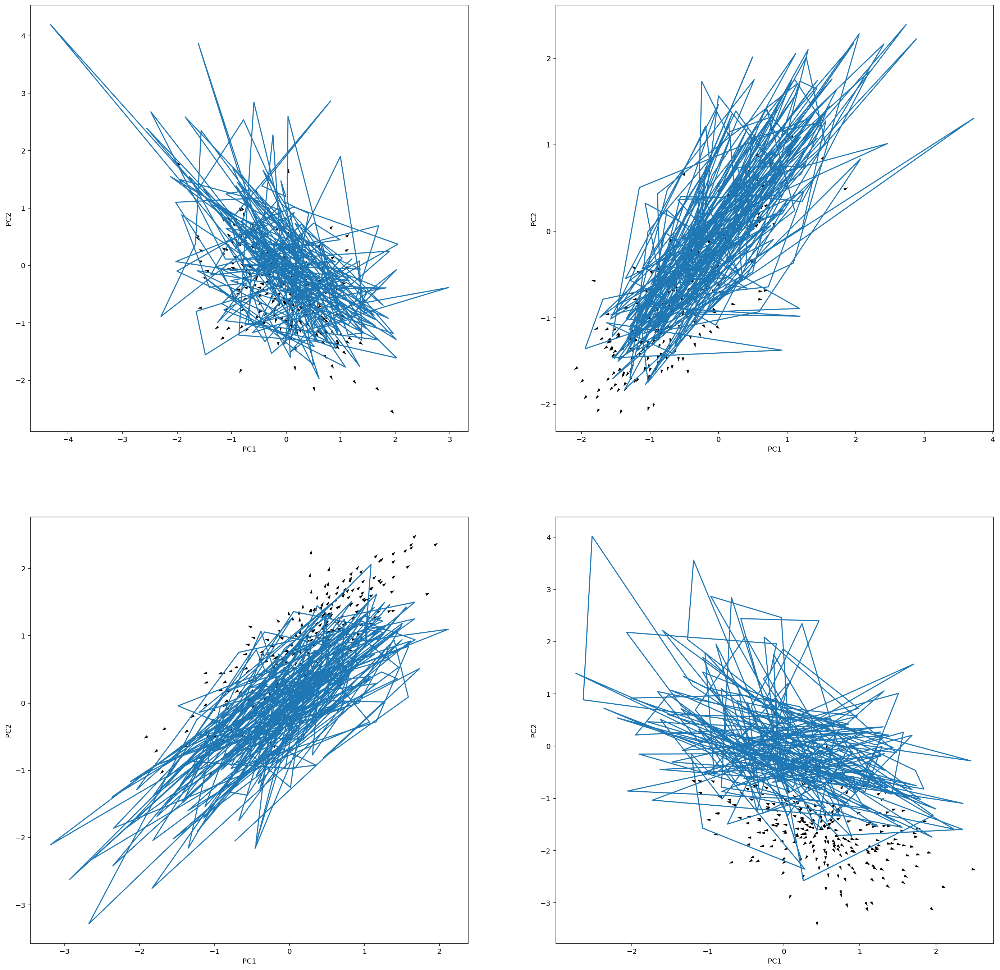

In [65]:
fig, axs = plt.subplots(2, 2, figsize=[24, 24])
axlist = axs.flatten()
for season in SEASONS:
  #this link helped me figure out how to put the arrows on the plot: https://stackoverflow.com/questions/58342419/show-direction-arrows-in-a-scatterplot
  x_difference = np.diff(eigenpatterns['singVal 0']['normalized'][season])
  x_position = eigenpatterns['singVal 0']['normalized'][season][-1] + x_difference/2
  y_difference = np.diff(eigenpatterns['singVal 1']['normalized'][season])
  y_position = eigenpatterns['singVal 1']['normalized'][season][-1] + y_difference/2
  norm = np.sqrt(x_difference**2+y_difference**2)
  axlist[SEASONS.index(season)].plot(eigenpatterns['singVal 0']['normalized'][season], eigenpatterns['singVal 1']['normalized'][season])
  axlist[SEASONS.index(season)].quiver(x_position, y_position, x_difference/norm, y_difference/norm, angles='xy', pivot='mid', scale=100)
  axlist[SEASONS.index(season)].set_xlabel('PC1')
  axlist[SEASONS.index(season)].set_ylabel('PC2')

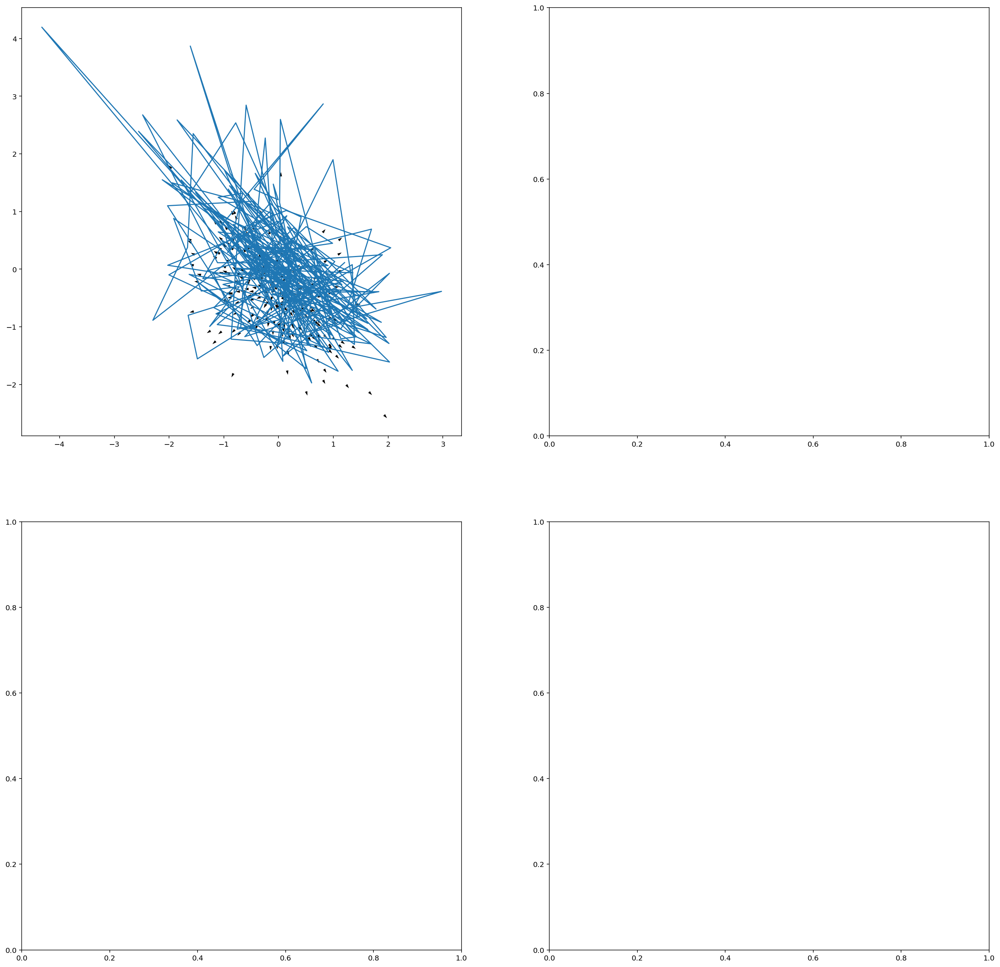

In [74]:
fig, axs = plt.subplots(2, 2, figsize=[24, 24])
axlist = axs.flatten()
x_difference = np.diff(eigenpatterns['singVal 0']['normalized']['DJF'])
x_position = eigenpatterns['singVal 0']['normalized']['DJF'][-1] + x_difference/2
y_difference = np.diff(eigenpatterns['singVal 1']['normalized']['DJF'])
y_position = eigenpatterns['singVal 1']['normalized']['DJF'][-1] + y_difference/2
norm = np.sqrt(x_difference**2+y_difference**2)
axlist[SEASONS.index('DJF')].plot(eigenpatterns['singVal 0']['normalized']['DJF'], eigenpatterns['singVal 1']['normalized']['DJF'])
axlist[SEASONS.index('DJF')].quiver(x_position, y_position, x_difference/norm, y_difference/norm, angles='xy', pivot='mid', scale=100)